In [1]:
import matplotlib.pyplot as plt
import numpy as np
import nidaqmx
import math
import time
import pandas as pd
import os
import datetime


In [2]:
carpeta = ""
datos_medicion = pd.read_csv(carpeta + "datos_array29_13_52_55.csv")

In [3]:
datos_medicion

,B,H,V_platino,V_R,Time
0,[],[],[],[],0.000000
1,"[0.028149264238230755, 0.029301077544200457, 0...","[0.21754032842264037, 0.2145785212433754, 0.21...","[-0.03404864948953164, -0.03437773895575143, -...","[-0.9072869899351462, -0.8806307674721625, -0....",0.081280
2,"[0.028149264238230755, 0.029630167060799878, 0...","[0.11042165182484694, 0.10762439035236165, 0.1...","[-0.013316012608603031, -0.01249328890198853, ...","[-0.33236816073488135, -0.33138089288820244, -...",0.162561
3,"[0.028149264238230755, 0.028642898511812544, 0...","[-0.007227857141525407, -0.009202394059441149,...","[0.025845637636208646, 0.026010182393057982, 0...","[0.6603308442329918, 0.6604953893458088, 0.642...",0.243841
4,"[0.024035645315305776, 0.030781980371028292, 0...","[-0.12899095052540066, -0.1311300316105261, -0...","[0.030123801336206124, 0.028642898511812544, 0...","[0.764487924658207, 0.7918024278724798, 0.7718...",0.325121
...,...,...,...,...,...
3688,"[0.04394556129605482, 0.04427465082478947, 0.0...","[0.018934757909160514, 0.015314773337296667, 0...","[-0.048199496312265666, -0.046554049030816405,...","[-0.8873770953670959, -0.8988952161818337, -0....",299.761758
3689,"[0.034895599363241804, 0.03538923364516054, 0....","[-0.13886363237948324, -0.14297724976079168, -...","[-0.026973225905074685, -0.026973225905074685,...","[-0.5441370859290431, -0.5100763529350751, -0....",299.843038
3690,"[0.02090929496197101, 0.022390197757902013, 0....","[-0.26210759529784217, -0.26474030983404395, -...","[0.027820174722847056, 0.0273265404502775, 0.0...","[0.47636947846051214, 0.5257329800596301, 0.47...",299.924319
3691,"[0.01202387829989264, 0.010542975541709312, 0....","[-0.3453671872526361, -0.3466835443550045, -0....","[0.04921099378887479, 0.046907367064577654, 0....","[0.8207623869310495, 0.8691386911897072, 0.823...",300.005599


In [4]:
df = datos_medicion 
i = 1
df["H"][i][1:-1]


'0.21754032842264037, 0.2145785212433754, 0.2121103486143316, 0.20881945180429512, 0.20569309986504297, 0.20141493410108485, 0.1986176719004778, 0.19565586489003123, 0.19252951307403288, 0.18858043713742886, 0.18594771987201383, 0.1826568233190128, 0.17920138197265711, 0.17541685101443766, 0.17261958902874283, 0.1698223270658436, 0.1655441617547689, 0.16192417576368326, 0.1587978242563271, 0.15616510721928534, 0.15205148688864797, 0.14892513546966785, 0.1451406048417745, 0.14184970867659835, 0.13839426773607466, 0.13460973722071096, 0.1313188411530299, 0.12835703471798315, 0.1242434147098131, 0.12062342914143931, 0.11749707799788504, 0.11371254770220593, 0.11075074141124953, 0.10663712160245933, 0.10318168099867084, 0.10005533000409332, 0.09659988946186293, 0.09297990416638127, 0.08968900847371296, 0.08639811280998207, 0.08277812761317702, 0.07899359767185278, 0.0752090677683525, 0.0720827170069212, 0.06879182149624377, 0.06533638124046569, 0.06122276192883326, 0.05859004559239429, 0.0

In [5]:
def string_to_list(data_str):
    """Convierte un string como '0.1, 0.2, 0.3' a lista de floats"""
    if isinstance(data_str, str):
        # Remover corchetes si existen y dividir por comas
        data_str = data_str.strip()
        if data_str.startswith('[') and data_str.endswith(']'):
            data_str = data_str[1:-1]
        
        # Dividir por comas y convertir a floats
        try:
            return [float(x.strip()) for x in data_str.split(',') if x.strip()]
        except ValueError:
            print(f"Error convirtiendo: {data_str[:50]}...")
            return []
    elif isinstance(data_str, list):
        return data_str  # Ya es una lista
    else:
        return [] 

# Convertir todas las entradas de las columnas H y B
X = [string_to_list(x) for x in datos_medicion["H"].iloc[1:]]
Y = [string_to_list(y) for y in datos_medicion["B"].iloc[1:]]

H_depurado = X[90:]
B_depurado = Y[90:]

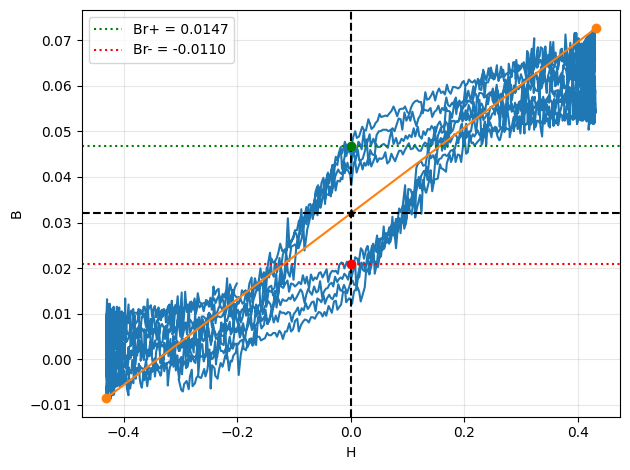

In [6]:
def encontrar_br(H, B, plot=False):
    H, B = np.array(H), np.array(B)
    

    offset_B = (np.max(B) + np.min(B)) / 2
    offset_H = (np.max(H) + np.min(H)) / 2

    H_cent = H - offset_H
    B_cent = B - offset_B
    
    # Buscar cruces por cero
    sign_changes = np.where(np.diff(np.sign(H_cent)))[0]
    Br_pos_cent, Br_neg_cent = None, None
    
    # Br+ (último cruce)
    for i in range(len(sign_changes)-1, -1, -1):
        idx = sign_changes[i]
        if H_cent[idx] > 0 and H_cent[idx+1] < 0:
            if H_cent[idx+1] != H_cent[idx]:
                Br_pos_cent = B_cent[idx] + (0 - H_cent[idx]) * \
                             (B_cent[idx+1] - B_cent[idx]) / (H_cent[idx+1] - H_cent[idx])
            break
    
    # Br- (primer cruce)
    for idx in sign_changes:
        if H_cent[idx] < 0 and H_cent[idx+1] > 0:
            if H_cent[idx+1] != H_cent[idx]:
                Br_neg_cent = B_cent[idx] + (0 - H_cent[idx]) * \
                             (B_cent[idx+1] - B_cent[idx]) / (H_cent[idx+1] - H_cent[idx])
            break
    if plot:
        plt.figure()
        plt.plot(H, B)
        plt.plot([np.min(H), np.max(H)], [np.min(B), np.max(B)], "o-")
        plt.plot(offset_H, offset_B, "k*")
        plt.axhline(y=offset_B, color='k', linestyle='--')
        plt.axvline(x=offset_H, color='k', linestyle='--')    

        if Br_pos_cent is not None:
            Br_pos = Br_pos_cent + offset_B
            plt.axhline(y=Br_pos, color='g', linestyle=':', label=f'Br+ = {Br_pos_cent:.4f}')
            plt.plot(offset_H, Br_pos, 'go')
        
        if Br_neg_cent is not None:
            Br_neg = Br_neg_cent + offset_B
            plt.axhline(y=Br_neg, color='r', linestyle=':', label=f'Br- = {Br_neg_cent:.4f}')
            plt.plot(offset_H, Br_neg, 'ro')
        
        plt.xlabel("H")
        plt.ylabel("B")
        plt.grid(True, alpha=0.3)
        if Br_pos_cent is not None or Br_neg_cent is not None:
            plt.legend()
        plt.tight_layout()
        plt.show()
    
    return Br_pos_cent, Br_neg_cent


H = H_depurado[5]  
B = B_depurado[5]  

B_pos, B_neg = encontrar_br(H, B, True)

C:\Users\User\AppData\Local\Temp\ipykernel_19656\740194466.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


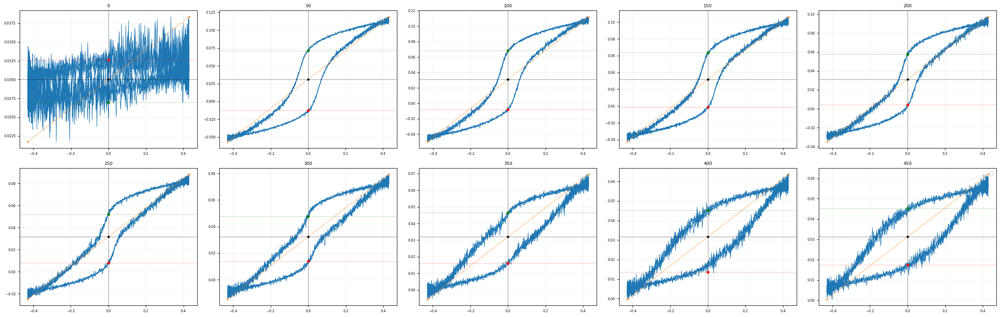

In [24]:

# Visualizar Grilla

filas = 2
columnas = 5

fig, axes = plt.subplots(filas, columnas, figsize=(columnas*5, filas*4))

for j in range(filas * columnas):
    i =  j * 50
    if j < len(X):
        fila = j // columnas
        col = j % columnas
        
    if i < len(H_depurado):
        Br_pos, Br_neg = encontrar_br(H_depurado[i], B_depurado[i], plot=True, ax=axes[fila, col])
        axes[fila, col].set_title(f'{i}', fontsize=8)
    else:
        axes[fila, col].axis('off')
      

plt.tight_layout()
plt.legend()
plt.show()

In [42]:
def almacenar_B_remanente(H_depurado,B_depurado):
    B_pos_array = []
    B_neg_array = []
    for i in range(len(H_depurado)):
        B_pos, B_neg = encontrar_br(H_depurado[i], B_depurado[i], False)
        B_pos_array.append(B_pos)
        B_neg_array.append(B_neg)
    return B_pos_array, B_neg_array


B_pos, B_neg = almacenar_B_remanente(H_depurado, B_depurado)
Time_depurado = np.array(datos_medicion["Time"][90:-1])
type(Time_depurado), type(B_pos)

(numpy.ndarray, list)

Text(0, 0.5, 'B_positivo')

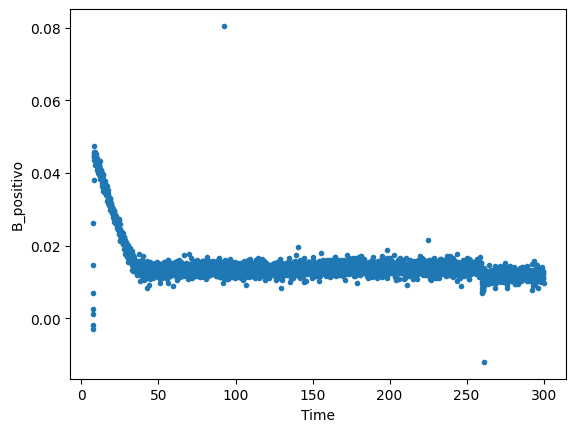

In [47]:
plt.plot(Time_depurado, np.array(B_pos), ".")
plt.xlabel("Time")
plt.ylabel("B_positivo")


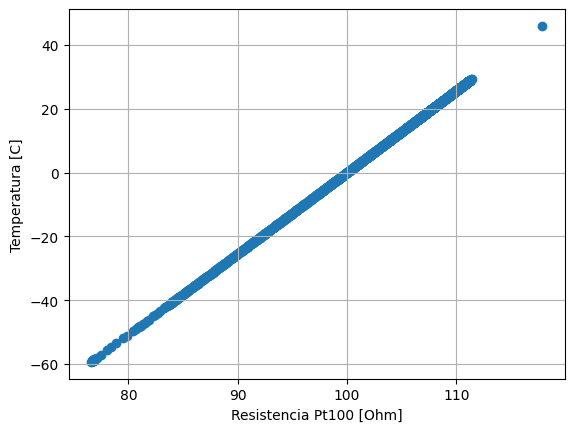

In [25]:
a = 1
b = -100
def temperatura(res):
    return res * a + b

def temp_kelv(res):
    return res * 0.00385 + 273.23 - 0.385

def resistencia_platino(V_plat, V_R, res=2000):
    return np.abs(V_plat / V_R) * res

v_arr = [[],[]]

V_R       = [string_to_list(x) for x in datos_medicion["V_R"].iloc[1:]]
V_platino = [string_to_list(y) for y in datos_medicion["V_platino"].iloc[1:]]

for i in range(len(V_platino) - 1):
    v_arr[0].append((np.std(np.array(V_platino[i+1]))))
    v_arr[1].append((np.std(np.array(V_R[i+1]))))



def PT100_res2temp_interp(R): #np.mean
    data = np.loadtxt('Pt100_resistencia_temperatura.csv',delimiter=',') 
    temperature_vals = data[:,0] # en Celsius
    resistance_vals = data[:,1] #en Ohm
    return np.interp(R, resistance_vals, temperature_vals)

R = resistencia_platino(np.array(v_arr[0]),  np.array(v_arr[1]))
plt.scatter(R, PT100_res2temp_interp(R))
plt.ylabel('Temperatura [C]')
plt.xlabel('Resistencia Pt100 [Ohm]')
plt.grid(True)